In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%load_ext line_profiler
%autoreload 2

import numpy as np

import matplotlib
matplotlib.rcParams.update({'font.size': 19})

import matplotlib.pyplot as plt
import os, glob, json

import enterprise
from enterprise.pulsar import Pulsar
import enterprise.signals.parameter as parameter
from enterprise.signals import utils
from enterprise.signals import signal_base
from enterprise.signals import selections
from enterprise.signals.selections import Selection
from enterprise.signals import white_signals
from enterprise.signals import gp_signals
from enterprise.signals import deterministic_signals
import enterprise.constants as const

import enterprise_extensions

import healpy as hp

import libstempo as T2
import libstempo.toasim as LT
import libstempo.plot as LP

import pickle

import BayesHopperBurst
import tau_scans_pta

# Setup

In [4]:
parfiles = sorted(glob.glob('../12p5yr-like_data/real_4/*.par'))
timfiles = sorted(glob.glob('../12p5yr-like_data/real_4/*.tim'))

print(parfiles)
print(timfiles)

psrlist = [ll.split("/")[-1][:-4] for ll in parfiles]
print(psrlist)
print(len(psrlist))

['../12p5yr-like_data/real_4/B1855+09.par', '../12p5yr-like_data/real_4/B1937+21.par', '../12p5yr-like_data/real_4/B1953+29.par', '../12p5yr-like_data/real_4/J0023+0923.par', '../12p5yr-like_data/real_4/J0030+0451.par', '../12p5yr-like_data/real_4/J0340+4130.par', '../12p5yr-like_data/real_4/J0613-0200.par', '../12p5yr-like_data/real_4/J0636+5128.par', '../12p5yr-like_data/real_4/J0645+5158.par', '../12p5yr-like_data/real_4/J0740+6620.par', '../12p5yr-like_data/real_4/J0931-1902.par', '../12p5yr-like_data/real_4/J1012+5307.par', '../12p5yr-like_data/real_4/J1024-0719.par', '../12p5yr-like_data/real_4/J1125+7819.par', '../12p5yr-like_data/real_4/J1453+1902.par', '../12p5yr-like_data/real_4/J1455-3330.par', '../12p5yr-like_data/real_4/J1600-3053.par', '../12p5yr-like_data/real_4/J1614-2230.par', '../12p5yr-like_data/real_4/J1640+2224.par', '../12p5yr-like_data/real_4/J1643-1224.par', '../12p5yr-like_data/real_4/J1713+0747.par', '../12p5yr-like_data/real_4/J1738+0333.par', '../12p5yr-like

In [3]:
%%time

tmin = 53216.1516728
stop_time = 57781.7766728 #for 12.5yr slice

psrs = []
for i, (p, t) in enumerate(zip(parfiles[::], timfiles[::])):
    print(p)
    psr = Pulsar(p, t, ephem='DE436', clk=None)
    psr.filter_data(start_time = 0.0, end_time = stop_time)
    if (psr.toas.size == 0) or (enterprise_extensions.model_utils.get_tspan([psr]) < 3*365.25*24*3600):
        print("Meh")
        continue
    else:
        print("yeah")
        psrs.append(psr)

#Test whether the time-span for the new dataset is really 12.5-yr
tspan = enterprise_extensions.model_utils.get_tspan(psrs)
print(tspan / (365.25 * 24 * 3600))
print(len(psrs))

../12p5yr-like_data/real_4/B1855+09.par


yeah
../12p5yr-like_data/real_4/B1937+21.par
[tempo2Util.C:396] Warning: [TIM1] Please place MODE flags in the parameter file 


yeah
../12p5yr-like_data/real_4/B1953+29.par
[tempo2Util.C:401] Warning: [DUP1] duplicated warnings have been suppressed.


yeah
../12p5yr-like_data/real_4/J0023+0923.par


yeah
../12p5yr-like_data/real_4/J0030+0451.par
yeah
../12p5yr-like_data/real_4/J0340+4130.par


yeah
../12p5yr-like_data/real_4/J0613-0200.par
yeah
../12p5yr-like_data/real_4/J0636+5128.par


yeah
../12p5yr-like_data/real_4/J0645+5158.par


yeah
../12p5yr-like_data/real_4/J0740+6620.par


yeah
../12p5yr-like_data/real_4/J0931-1902.par


yeah
../12p5yr-like_data/real_4/J1012+5307.par
yeah
../12p5yr-like_data/real_4/J1024-0719.par
yeah
../12p5yr-like_data/real_4/J1125+7819.par


yeah
../12p5yr-like_data/real_4/J1453+1902.par


yeah
../12p5yr-like_data/real_4/J1455-3330.par
yeah
../12p5yr-like_data/real_4/J1600-3053.par
yeah
../12p5yr-like_data/real_4/J1614-2230.par


yeah
../12p5yr-like_data/real_4/J1640+2224.par
yeah
../12p5yr-like_data/real_4/J1643-1224.par
yeah
../12p5yr-like_data/real_4/J1713+0747.par
yeah
../12p5yr-like_data/real_4/J1738+0333.par


yeah
../12p5yr-like_data/real_4/J1741+1351.par


yeah
../12p5yr-like_data/real_4/J1744-1134.par
yeah
../12p5yr-like_data/real_4/J1747-4036.par


yeah
../12p5yr-like_data/real_4/J1832-0836.par


yeah
../12p5yr-like_data/real_4/J1853+1303.par


yeah
../12p5yr-like_data/real_4/J1903+0327.par


yeah
../12p5yr-like_data/real_4/J1909-3744.par
yeah
../12p5yr-like_data/real_4/J1910+1256.par
yeah
../12p5yr-like_data/real_4/J1911+1347.par


yeah
../12p5yr-like_data/real_4/J1918-0642.par


yeah
../12p5yr-like_data/real_4/J1923+2515.par
yeah
../12p5yr-like_data/real_4/J1944+0907.par


yeah
../12p5yr-like_data/real_4/J2010-1323.par


yeah
../12p5yr-like_data/real_4/J2017+0603.par


yeah
../12p5yr-like_data/real_4/J2033+1734.par


yeah
../12p5yr-like_data/real_4/J2043+1711.par


yeah
../12p5yr-like_data/real_4/J2145-0750.par
yeah
../12p5yr-like_data/real_4/J2214+3000.par


yeah
../12p5yr-like_data/real_4/J2229+2643.par


yeah
../12p5yr-like_data/real_4/J2234+0611.par


yeah
../12p5yr-like_data/real_4/J2234+0944.par
yeah
../12p5yr-like_data/real_4/J2302+4442.par


yeah
../12p5yr-like_data/real_4/J2317+1439.par
yeah
12.497185184808304
CPU times: user 5min 39s, sys: 8.32 s, total: 5min 47s
Wall time: 1min 47s


45


/tmp/ipykernel_33968/2987483844.py:5: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  injected_data = T2.tempopulsar(parfile = parfiles[idx], timfile = timfiles[idx], maxobs=30000, ephem='DE436',clk=None)
/tmp/ipykernel_33968/2987483844.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(idx)


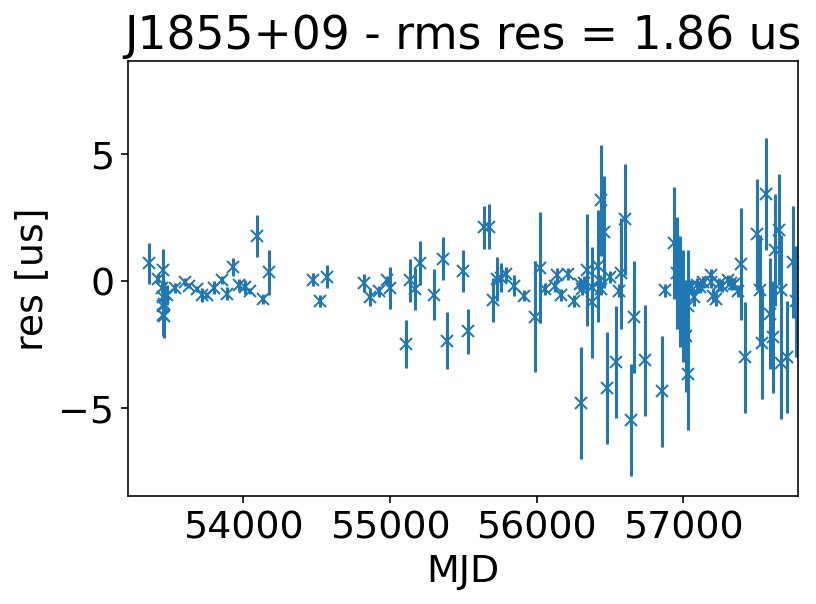

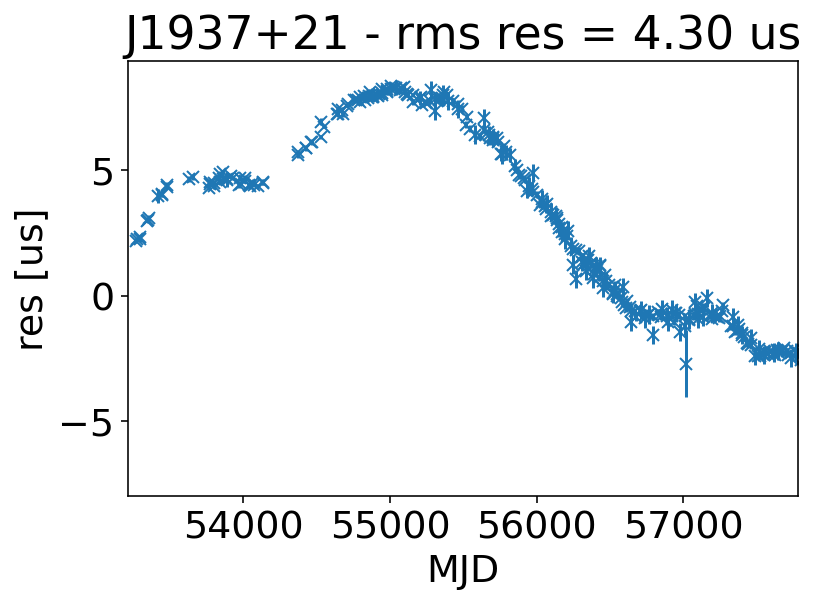

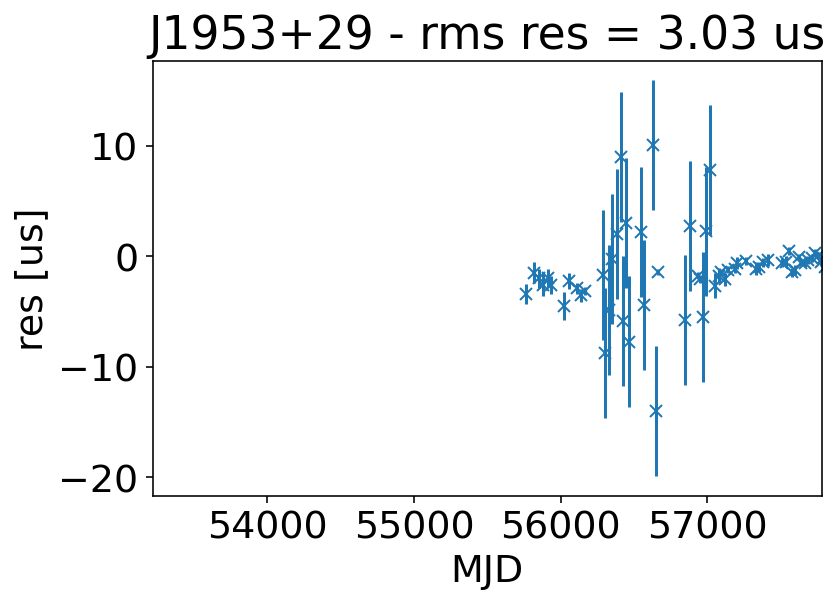

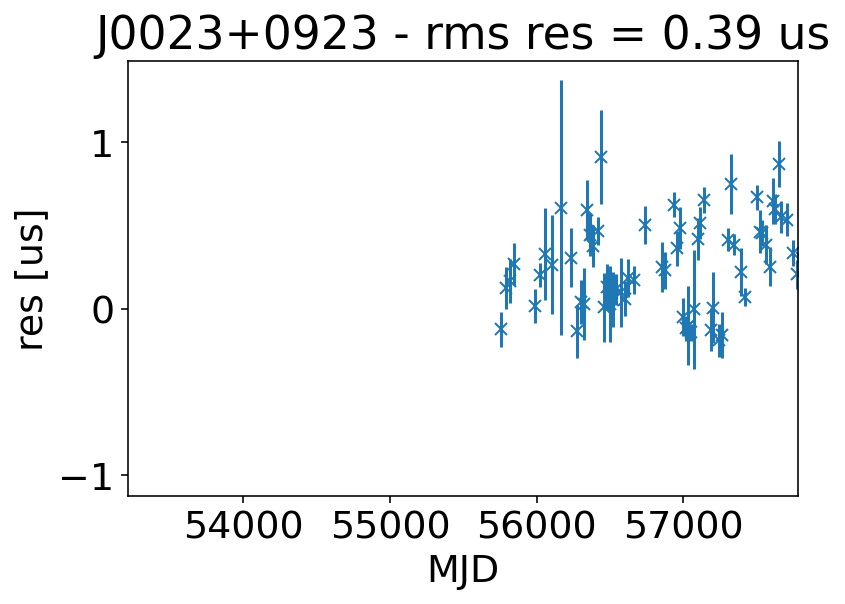

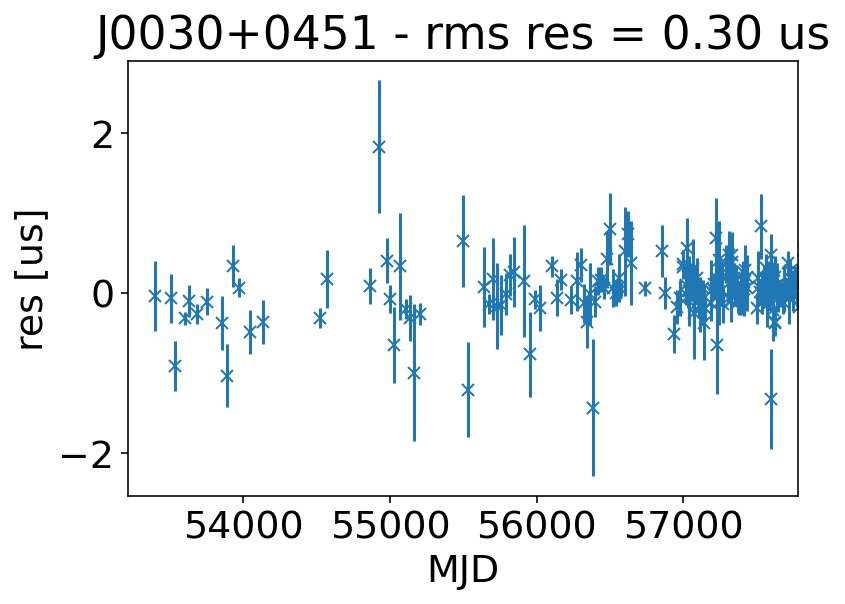

...

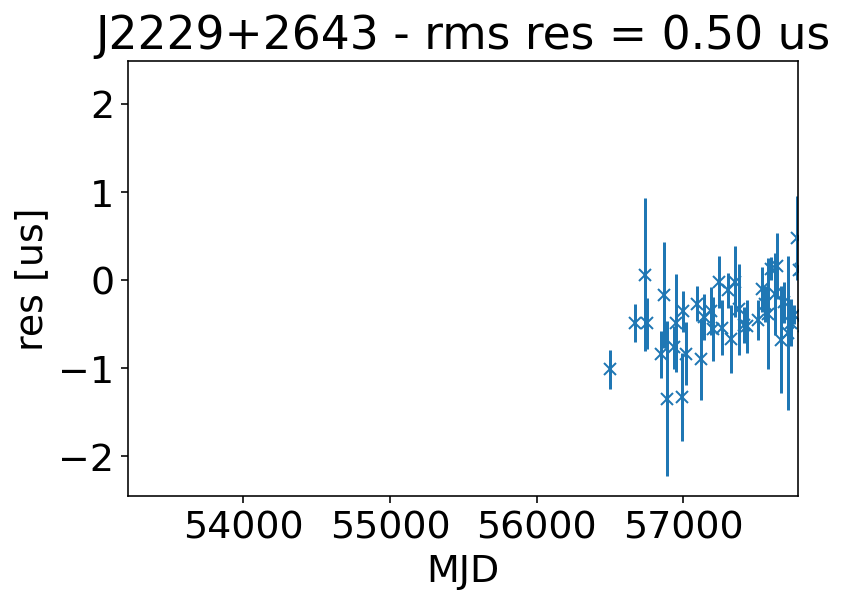

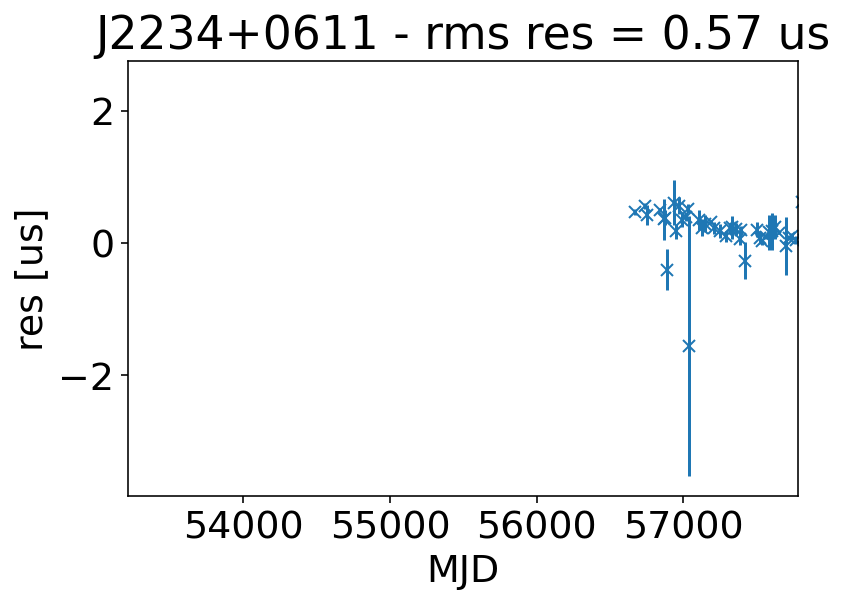

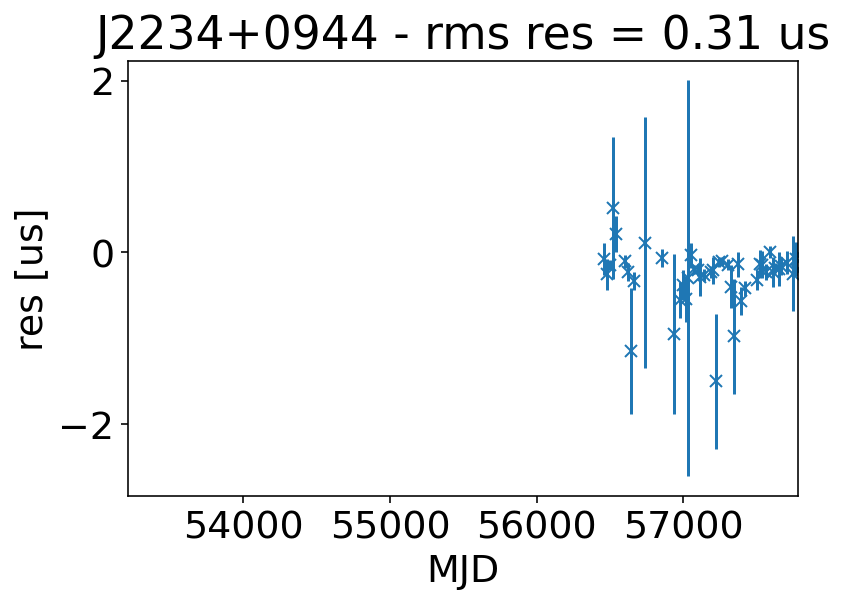

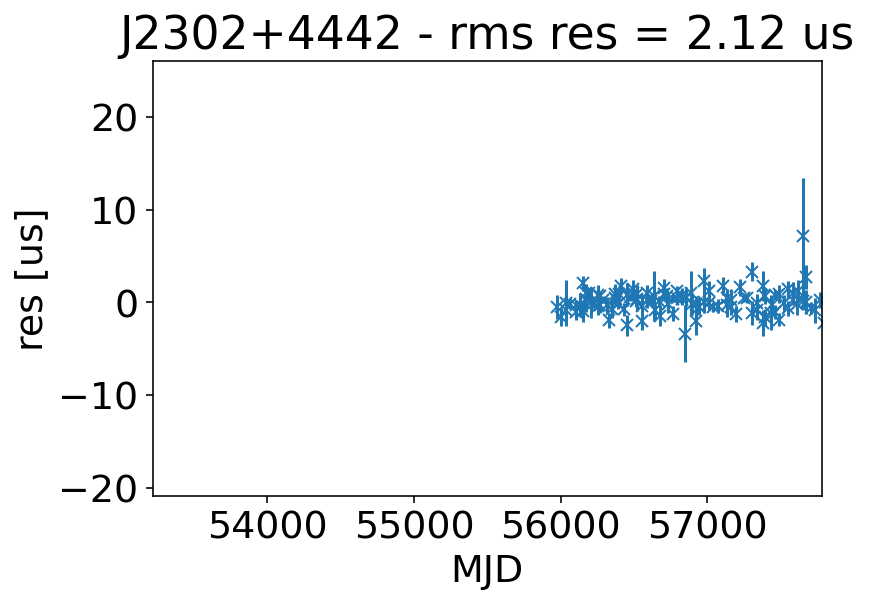

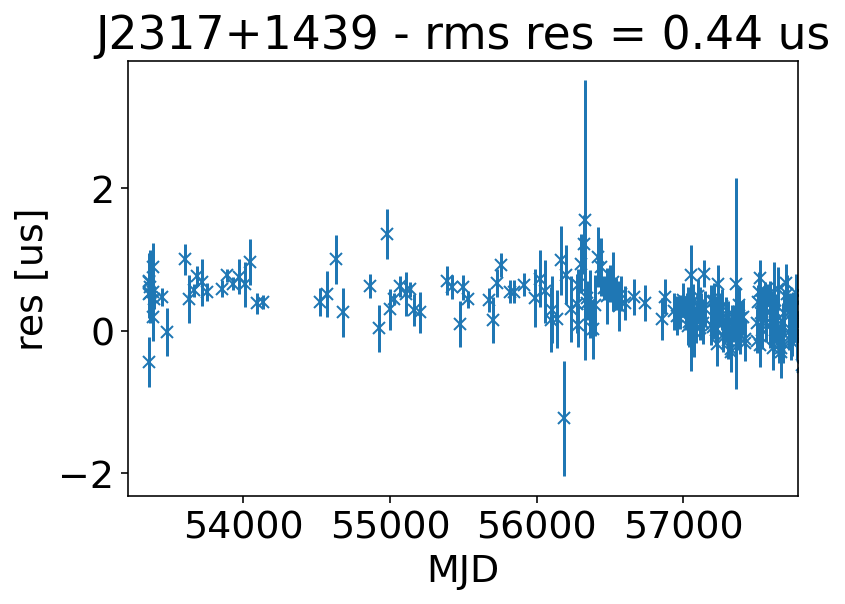

In [6]:
print(len(psrs))

for idx in range(len(psrs)):
    plt.figure(idx)
    injected_data = T2.tempopulsar(parfile = parfiles[idx], timfile = timfiles[idx], maxobs=30000, ephem='DE436',clk=None)
    LP.plotres(injected_data, label='Data')
    plt.xlim((tmin,stop_time))

# Signal tau-scans

In [8]:
efac_params = {psr_name+"_efac":1.0 for idx, psr_name in enumerate(psrlist)}

equad_params = {psr_name+"_log10_equad":-17 for idx, psr_name in enumerate(psrlist)} #basically setting to 0

params = {**efac_params, **equad_params}
print(params)

noisedict_file = "../12p5yr-like_data/channelized_12p5yr_v3_full_noisedict_BayesHopperBurst.json"

pta = BayesHopperBurst.get_ptas(psrs, noisedict_file=noisedict_file,
                                vary_white_noise=False, include_per_psr_rn=True, include_rn=False,
                                include_gwb=False)[0][0][0]

print(pta.summary())

#TauScan = tau_scans_pta.TauScan([psrs[2],], params=params)
#TauScan = tau_scans_pta.TauScan([psrs[0],], params=params)
TauScan = tau_scans_pta.TauScan(psrs, params=params, pta=pta)
#TauScan = tau_scans_pta.TauScan(psrs[:4], params=params)

{'B1855+09_efac': 1.0, 'B1937+21_efac': 1.0, 'B1953+29_efac': 1.0, 'J0023+0923_efac': 1.0, 'J0030+0451_efac': 1.0, 'J0340+4130_efac': 1.0, 'J0613-0200_efac': 1.0, 'J0636+5128_efac': 1.0, 'J0645+5158_efac': 1.0, 'J0740+6620_efac': 1.0, 'J0931-1902_efac': 1.0, 'J1012+5307_efac': 1.0, 'J1024-0719_efac': 1.0, 'J1125+7819_efac': 1.0, 'J1453+1902_efac': 1.0, 'J1455-3330_efac': 1.0, 'J1600-3053_efac': 1.0, 'J1614-2230_efac': 1.0, 'J1640+2224_efac': 1.0, 'J1643-1224_efac': 1.0, 'J1713+0747_efac': 1.0, 'J1738+0333_efac': 1.0, 'J1741+1351_efac': 1.0, 'J1744-1134_efac': 1.0, 'J1747-4036_efac': 1.0, 'J1832-0836_efac': 1.0, 'J1853+1303_efac': 1.0, 'J1903+0327_efac': 1.0, 'J1909-3744_efac': 1.0, 'J1910+1256_efac': 1.0, 'J1911+1347_efac': 1.0, 'J1918-0642_efac': 1.0, 'J1923+2515_efac': 1.0, 'J1944+0907_efac': 1.0, 'J2010-1323_efac': 1.0, 'J2017+0603_efac': 1.0, 'J2033+1734_efac': 1.0, 'J2043+1711_efac': 1.0, 'J2145-0750_efac': 1.0, 'J2214+3000_efac': 1.0, 'J2229+2643_efac': 1.0, 'J2234+0611_efac': 1.

In [12]:
%%time
#t_res = 100
#f_res = 50
#tau_res = 10

#original
f_max = 1e-7
f_min = 3.5e-9
#narrow f
#f_max = 10**(-7.5)
#f_min = 1e-8
#narrow f2
#f_max = 1e-8
#f_min = 10**(-8.25)

#original
t_max = 12.5
t_min = 0.0
#zoom in 1
#t_max = 12.5
#t_min = 0.41666667
#zoom in 2
#t_max = 12.5
#t_min = 8.0
#narrow_f2
#t_max = 12.5
#t_min = 2.0

tau_min = 0.2
tau_max = 5.0

TS_dict = tau_scans_pta.make_tau_scan_map(TauScan, f_min=f_min, f_max=f_max, t_min=t_min, t_max=t_max,
                                tau_min=tau_min, tau_max=tau_max)

tau_scan = TS_dict['tau_scan']
tau_edges = TS_dict['tau_edges']
T0_list = TS_dict['t0_edges']
F0_list = TS_dict['f0_edges']

1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
CPU times: user 24min 39s, sys: 25min 47s, total: 50min 26s
Wall time: 7min 14s


117.66789576636582


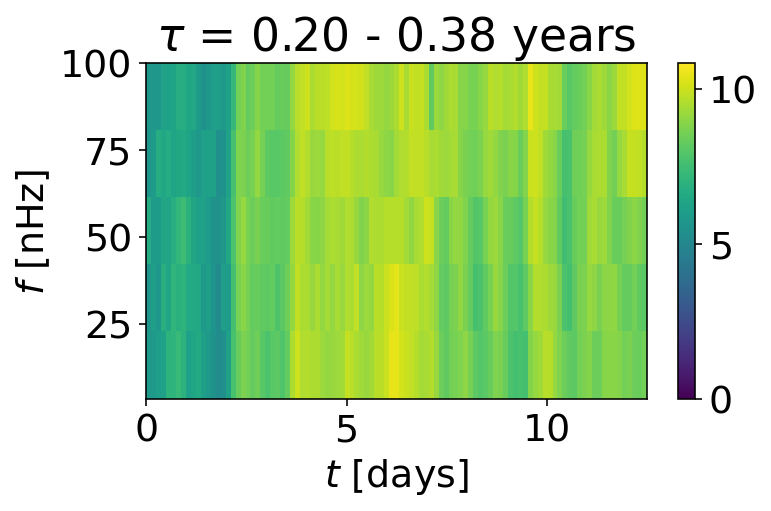

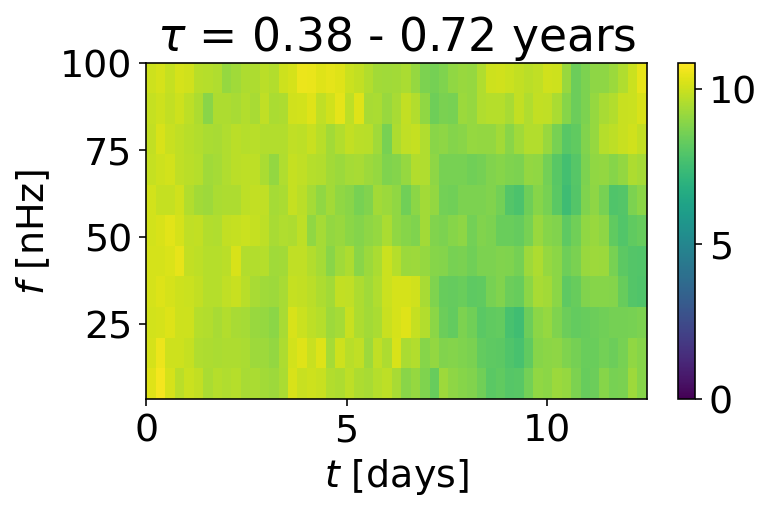

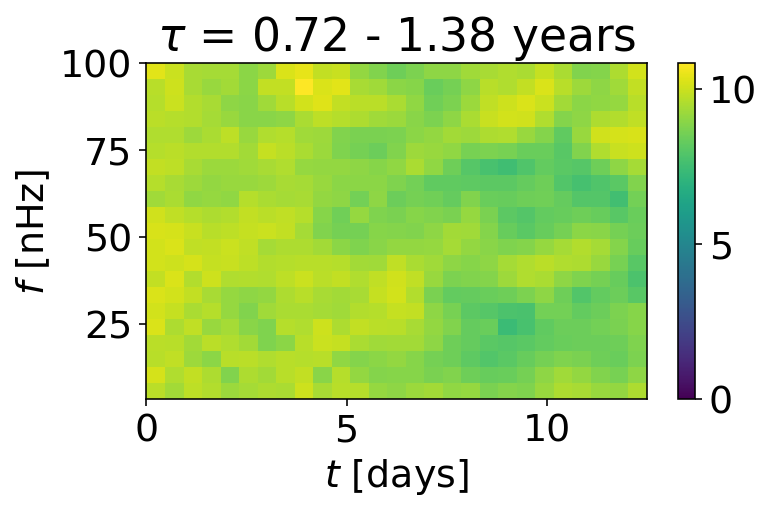

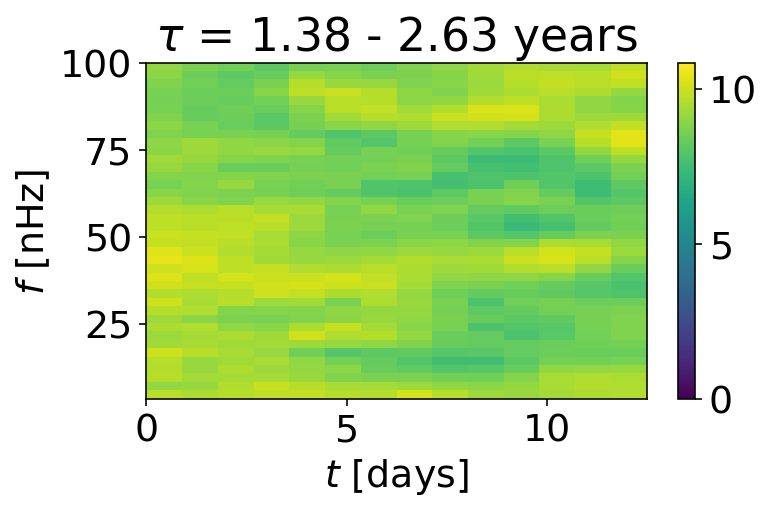

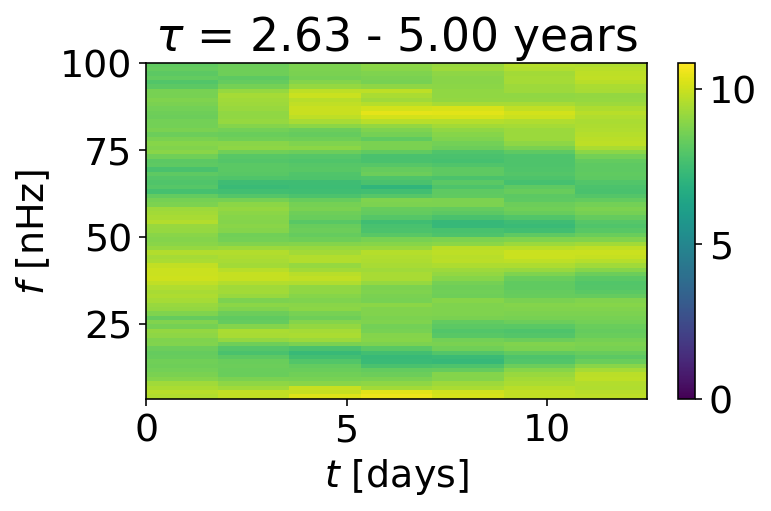

In [15]:
scan_max = max([np.max(x) for x in tau_scan])
print(scan_max)
#print(np.max(tau_scan))
for l in range(tau_edges.size-1):
    fig = plt.figure(l)
    c = plt.gca().pcolormesh(T0_list[l]/24/3600/365.25, F0_list[l]/1e-9 , np.sqrt(tau_scan[l]),
                             vmax=np.sqrt(scan_max), vmin=0.0)
    plt.colorbar(c)
    #plt.plot(t0_true/24/3600, f0_true/1e-9, marker='x', ms=10, c='w')
    plt.title(r"$\tau$ = {0:.2f} - {1:.2f} years".format(tau_edges[l], tau_edges[l+1]))
    plt.xlabel(r"$t$ [days]")
    plt.ylabel(r"$f$ [nHz]")
    plt.tight_layout()

In [17]:
#with open("../12p5yr-like_data/TauScans/tauscan_12p5yr-like_real4_RN.pkl", 'wb') as f:
#    pickle.dump(TS_dict, f)

# Noise transient tau-scans

In [23]:
efac_params = {psr_name+"_efac":1.0 for idx, psr_name in enumerate(psrlist)}

equad_params = {psr_name+"_log10_equad":-17 for idx, psr_name in enumerate(psrlist)} #basically setting to 0

params = {**efac_params, **equad_params}
print(params)

#original
f_max = 1e-7
f_min = 3.5e-9
#narrow f
#f_max = 10**(-7.5)
#f_min = 1e-8
#narrow f2
#f_max = 1e-8
#f_min = 10**(-8.25)

#original
t_max = 12.5
t_min = 0.0
#zoom in 1
#t_max = 12.5
#t_min = 0.41666667
#zoom in 2
#t_max = 12.5
#t_min = 8.0
#narrow_f2
#t_max = 12.5
#t_min = 2.0

tau_min = 0.2
tau_max = 5.0

{'B1855+09_efac': 1.0, 'B1937+21_efac': 1.0, 'B1953+29_efac': 1.0, 'J0023+0923_efac': 1.0, 'J0030+0451_efac': 1.0, 'J0340+4130_efac': 1.0, 'J0613-0200_efac': 1.0, 'J0636+5128_efac': 1.0, 'J0645+5158_efac': 1.0, 'J0740+6620_efac': 1.0, 'J0931-1902_efac': 1.0, 'J1012+5307_efac': 1.0, 'J1024-0719_efac': 1.0, 'J1125+7819_efac': 1.0, 'J1453+1902_efac': 1.0, 'J1455-3330_efac': 1.0, 'J1600-3053_efac': 1.0, 'J1614-2230_efac': 1.0, 'J1640+2224_efac': 1.0, 'J1643-1224_efac': 1.0, 'J1713+0747_efac': 1.0, 'J1738+0333_efac': 1.0, 'J1741+1351_efac': 1.0, 'J1744-1134_efac': 1.0, 'J1747-4036_efac': 1.0, 'J1832-0836_efac': 1.0, 'J1853+1303_efac': 1.0, 'J1903+0327_efac': 1.0, 'J1909-3744_efac': 1.0, 'J1910+1256_efac': 1.0, 'J1911+1347_efac': 1.0, 'J1918-0642_efac': 1.0, 'J1923+2515_efac': 1.0, 'J1944+0907_efac': 1.0, 'J2010-1323_efac': 1.0, 'J2017+0603_efac': 1.0, 'J2033+1734_efac': 1.0, 'J2043+1711_efac': 1.0, 'J2145-0750_efac': 1.0, 'J2214+3000_efac': 1.0, 'J2229+2643_efac': 1.0, 'J2234+0611_efac': 1.

In [24]:
%%time

TS_all = {}

for i in range(len(psrs)):
    print(i)
    
    noisedict_file = "../12p5yr-like_data/channelized_12p5yr_v3_full_noisedict_BayesHopperBurst.json"
    
    pta = BayesHopperBurst.get_ptas([psrs[i],], noisedict_file=noisedict_file,
                                vary_white_noise=False, include_per_psr_rn=True, include_rn=False,
                                include_gwb=False)[0][0][0]

    #print(pta.summary())
    
    TauScan = tau_scans_pta.TauScan([psrs[i],], params=params, pta=pta)
    TS_dict = tau_scans_pta.make_tau_scan_map(TauScan, f_min=f_min, f_max=f_max, t_min=t_min, t_max=t_max,
                                tau_min=tau_min, tau_max=tau_max)
    TS_all['tau_edges'] = TS_dict['tau_edges']
    TS_all['t0_edges'] = TS_dict['t0_edges']
    TS_all['f0_edges'] = TS_dict['f0_edges']
    TS_all['tau_scan'+str(i)] = TS_dict['tau_scan']

0
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
1
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
2
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
3
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
4
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
5
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
6
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
7
1  /  5
5
101
SUM:  505
2  /  5
11
53
SUM:  583
3  /  5
21
27
SUM:  567
4  /  5
40
14
SUM:  560
5  /  5
77
7
SUM:  539
8
1  /  5
5
101
SUM:  505
2  /  

dict_keys(['tau_edges', 't0_edges', 'f0_edges', 'tau_scan0', 'tau_scan1', 'tau_scan2', 'tau_scan3', 'tau_scan4', 'tau_scan5', 'tau_scan6', 'tau_scan7', 'tau_scan8', 'tau_scan9', 'tau_scan10', 'tau_scan11', 'tau_scan12', 'tau_scan13', 'tau_scan14', 'tau_scan15', 'tau_scan16', 'tau_scan17', 'tau_scan18', 'tau_scan19', 'tau_scan20', 'tau_scan21', 'tau_scan22', 'tau_scan23', 'tau_scan24', 'tau_scan25', 'tau_scan26', 'tau_scan27', 'tau_scan28', 'tau_scan29', 'tau_scan30', 'tau_scan31', 'tau_scan32', 'tau_scan33', 'tau_scan34', 'tau_scan35', 'tau_scan36', 'tau_scan37', 'tau_scan38', 'tau_scan39', 'tau_scan40', 'tau_scan41', 'tau_scan42', 'tau_scan43', 'tau_scan44'])
15.802117221286927
0
1
2
3
4
18.237511542203407
5
6
7
8
9
6.8497794816329645
10
11
12
13
14
4.089111571299547
15
16
17
18
19
10.476866806132902
20
21
22
23


/tmp/ipykernel_33968/2285750718.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(l+i*(tau_edges.size-1))


24
12.812976630467636
25
26
27
28
29
11.391660352492455
30
31
32
33
34
10.153685343385643
35
36
37
38
39
8.648469313488228
40
41
42
43
44
5.036361823540213
45
46
47
48
49
10.465604546993065
50
51
52
53
54
9.19911321762951
55
56
57
58
59
18.354960459394015
60
61
62
63
64
4.568867095491897
65
66
67
68
69
4.570778304661496
70
71
72
73
74
14.61069669648981
75
76
77
78
79
7.835545172028735
80
81
82
83
84
14.806186845602138
85
86
87
88
89
14.398033829892533
90
91
92
93
94
10.546727579190982
95
96
97
98
99
12.093999759361777
100
101
102
103
104
6.4557286433564105
105
106
107
108
109
12.071741945120488
110
111
112
113
114
4.201097324171011
115
116
117
118
119
7.930510339413774
120
121
122
123
124
9.543189330610726
125
126
127
128
129
4.566709682763902
130
131
132
133
134
8.323484781177315
135
136
137
138
139
10.740230312878387
140
141
142
143
144
9.208125317659798
145
146
147
148
149
12.767439840544123
150
151
152
153
154
12.313871489400507
155
156
157
158
159
14.701532990341818
160
161
162
16

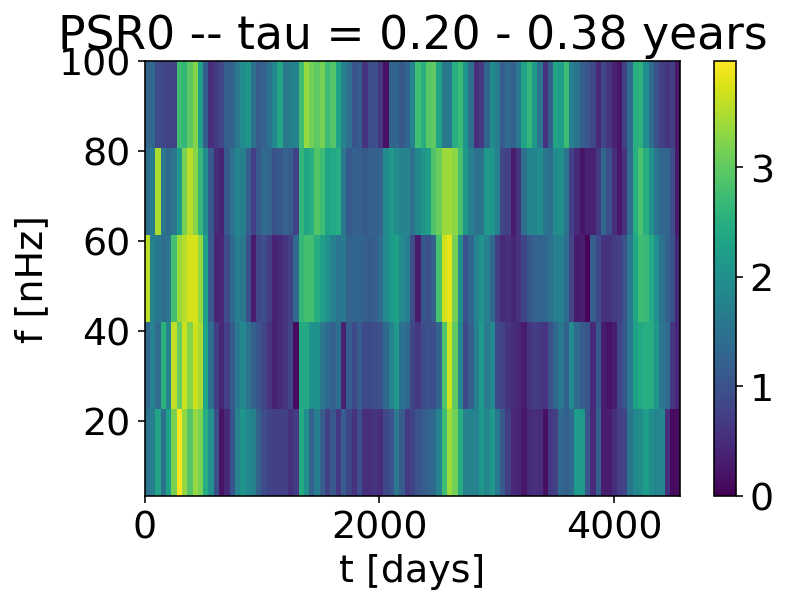

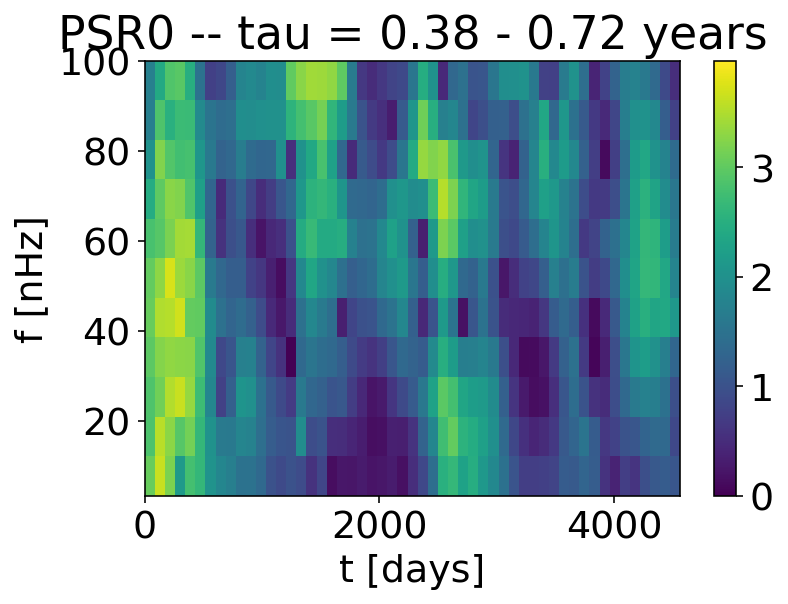

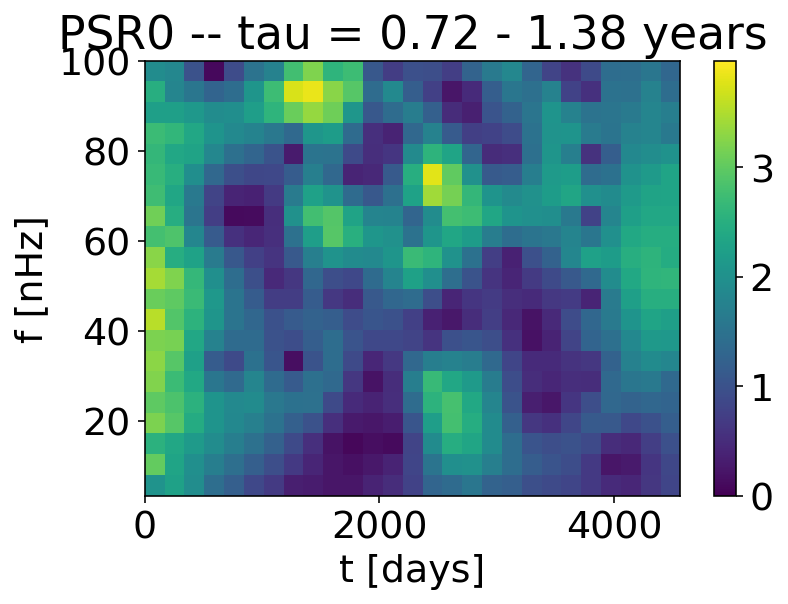

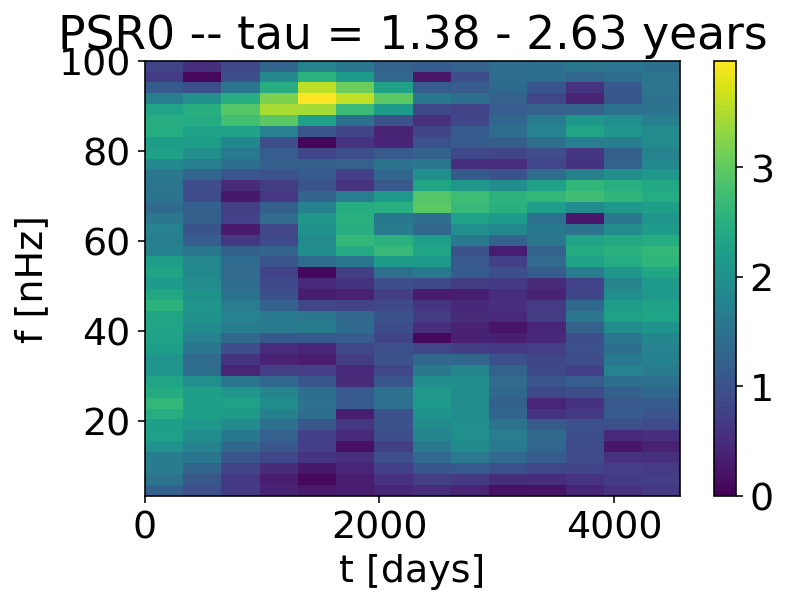

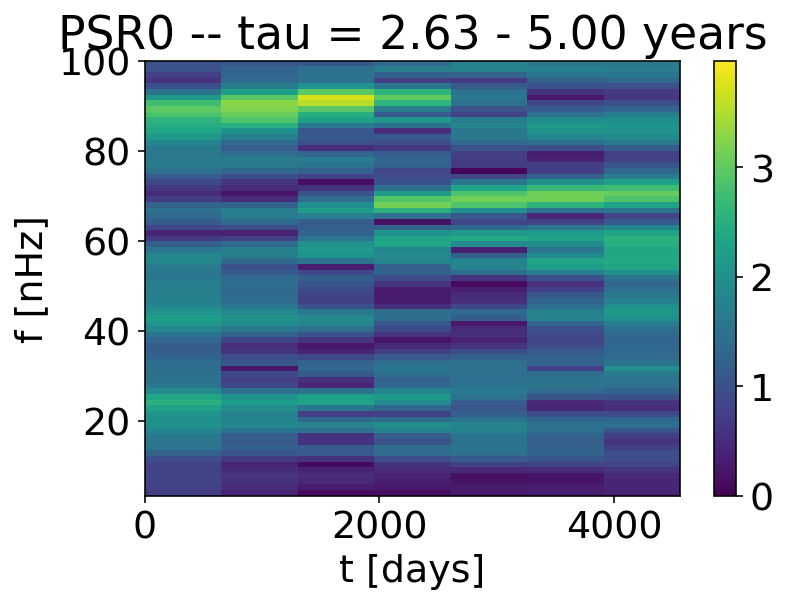

...

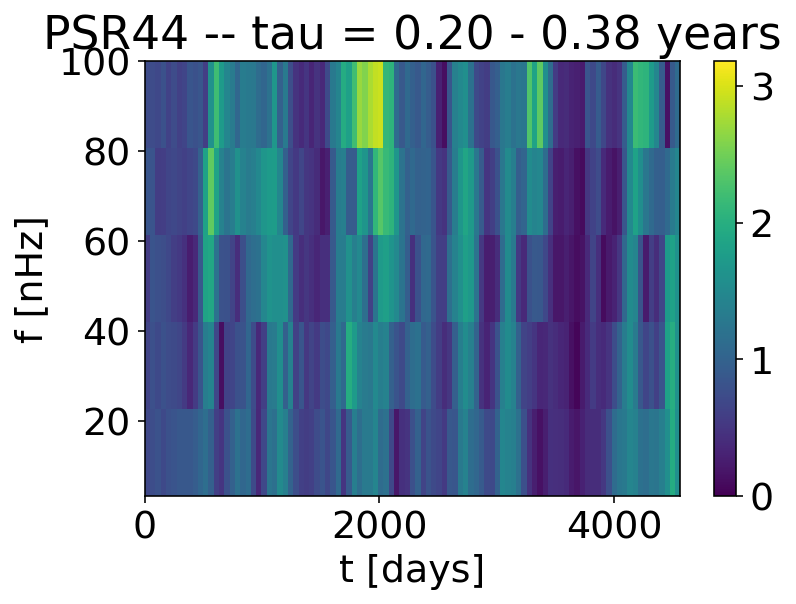

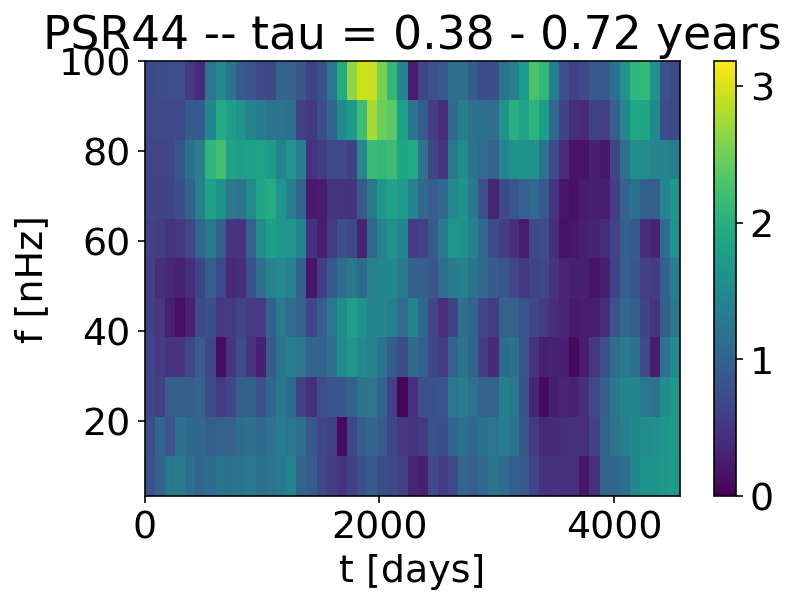

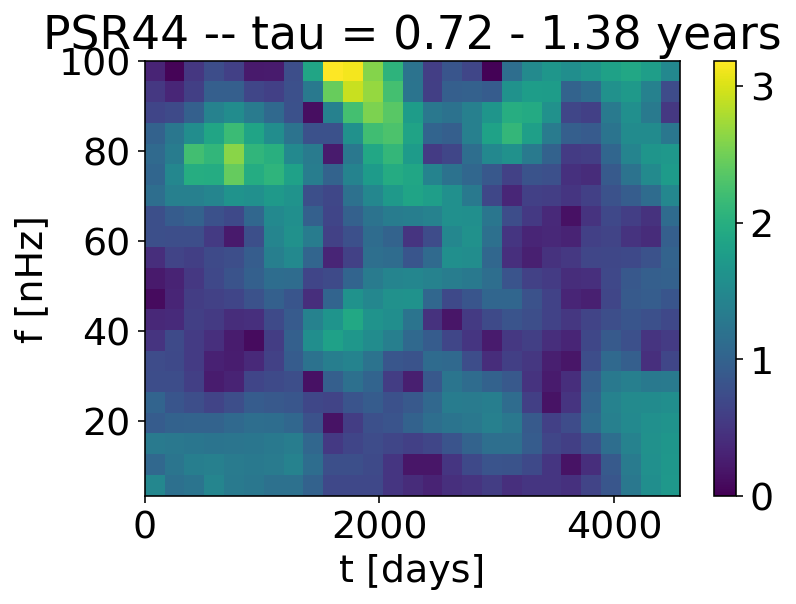

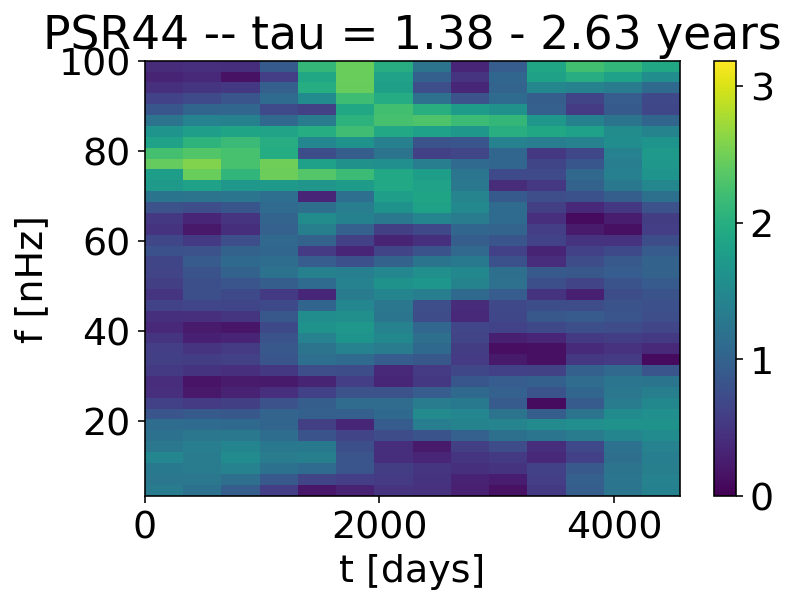

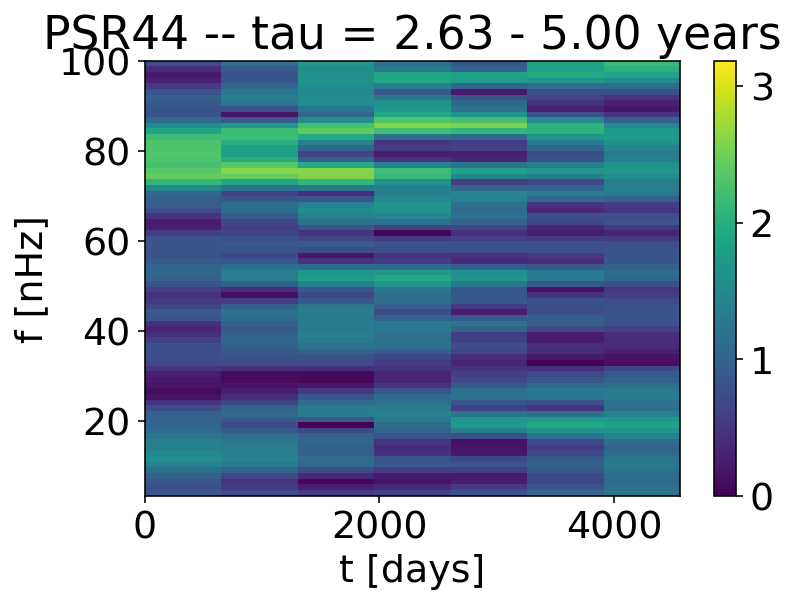

In [25]:
print(TS_all.keys())

tau_edges = TS_all['tau_edges']
T0_list = TS_all['t0_edges']
F0_list = TS_dict['f0_edges']

for i in range(len(psrs)):
    #print(i)
    tau_scan = TS_all['tau_scan'+str(i)]
    scan_max = max([np.max(x) for x in tau_scan])
    print(scan_max)
    #print(np.max(tau_scan))
    for l in range(tau_edges.size-1):
        print(i*(tau_edges.size-1)+l)
        fig = plt.figure(l+i*(tau_edges.size-1))
        #c = plt.gca().pcolormesh(t0s/24/3600, f0s/1e-9, tau_scan[l])#, vmax=np.max(tau_scan), vmin=0.0)
        c = plt.gca().pcolormesh(T0_list[l]/24/3600, F0_list[l]/1e-9 ,np.sqrt(tau_scan[l]), vmax=np.sqrt(scan_max), vmin=0.0)
        plt.colorbar(c)
        #plt.plot(t0_true/24/3600, f0_true/1e-9, marker='x', ms=10, c='w')
        #plt.plot(t0_glitch/24/3600, f0_glitch/1e-9, marker='o', ms=10, c='xkcd:salmon')
        #plt.plot(t0_true2/24/3600, f0_true2/1e-9, marker='x', ms=10, c='w')
        plt.title("PSR{2:d} -- tau = {0:.2f} - {1:.2f} years".format(tau_edges[l], tau_edges[l+1], i))
        plt.xlabel("t [days]")
        plt.ylabel("f [nHz]")

In [26]:
#with open("../12p5yr-like_data/TauScans/glitch_tauscan_12p5yr-like_real4_RN.pkl.pkl", 'wb') as f:
#    pickle.dump(TS_all, f)